In [2]:
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
from altair import *
from nltk import tokenize
from nltk.corpus import stopwords
import string
import collections
import wordcloud as WordCloud
import ggplot
from mpl_toolkits.basemap import Basemap
import numpy as np

In [3]:
tweets = pd.read_csv('Tweets.csv')
tweets

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)
5,570300767074181121,negative,1.0000,Can't Tell,0.6842,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica seriously would pay $30 a fligh...,NaN,2015-02-24 11:14:33 -0800,NaN,Pacific Time (US & Canada)
6,570300616901320704,positive,0.6745,NaN,0.0000,Virgin America,NaN,cjmcginnis,NaN,0,"@VirginAmerica yes, nearly every time I fly VX...",NaN,2015-02-24 11:13:57 -0800,San Francisco CA,Pacific Time (US & Canada)
7,570300248553349120,neutral,0.6340,NaN,NaN,Virgin America,NaN,pilot,NaN,0,@VirginAmerica Really missed a prime opportuni...,NaN,2015-02-24 11:12:29 -0800,Los Angeles,Pacific Time (US & Canada)
8,570299953286942721,positive,0.6559,NaN,NaN,Virgin America,NaN,dhepburn,NaN,0,"@virginamerica Well, I didn't…but NOW I DO! :-D",NaN,2015-02-24 11:11:19 -0800,San Diego,Pacific Time (US & Canada)
9,570295459631263746,positive,1.0000,NaN,NaN,Virgin America,NaN,YupitsTate,NaN,0,"@VirginAmerica it was amazing, and arrived an ...",NaN,2015-02-24 10:53:27 -0800,Los Angeles,Eastern Time (US & Canada)


In [4]:
flights = tweets.groupby(tweets.airline)
flights.head()

,tweet_id,airline_sentiment,airline_sentiment_confidence,negativereason,negativereason_confidence,airline,airline_sentiment_gold,name,negativereason_gold,retweet_count,text,tweet_coord,tweet_created,tweet_location,user_timezone
0,570306133677760513,neutral,1.0000,NaN,NaN,Virgin America,NaN,cairdin,NaN,0,@VirginAmerica What @dhepburn said.,NaN,2015-02-24 11:35:52 -0800,NaN,Eastern Time (US & Canada)
1,570301130888122368,positive,0.3486,NaN,0.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica plus you've added commercials t...,NaN,2015-02-24 11:15:59 -0800,NaN,Pacific Time (US & Canada)
2,570301083672813571,neutral,0.6837,NaN,NaN,Virgin America,NaN,yvonnalynn,NaN,0,@VirginAmerica I didn't today... Must mean I n...,NaN,2015-02-24 11:15:48 -0800,Lets Play,Central Time (US & Canada)
3,570301031407624196,negative,1.0000,Bad Flight,0.7033,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica it's really aggressive to blast...,NaN,2015-02-24 11:15:36 -0800,NaN,Pacific Time (US & Canada)
4,570300817074462722,negative,1.0000,Can't Tell,1.0000,Virgin America,NaN,jnardino,NaN,0,@VirginAmerica and it's a really big bad thing...,NaN,2015-02-24 11:14:45 -0800,NaN,Pacific Time (US & Canada)
504,570307876897628160,positive,1.0000,NaN,NaN,United,NaN,rdowning76,NaN,0,@united thanks,NaN,2015-02-24 11:42:48 -0800,usa,NaN
505,570307847281614848,positive,1.0000,NaN,NaN,United,NaN,CoreyAStewart,NaN,0,@united Thanks for taking care of that MR!! Ha...,NaN,2015-02-24 11:42:41 -0800,"Richmond, VA",Eastern Time (US & Canada)
506,570307109704900608,negative,1.0000,Cancelled Flight,0.7030,United,NaN,CoralReefer420,NaN,0,@united still no refund or word via DM. Please...,NaN,2015-02-24 11:39:45 -0800,"Bay Area, California",Alaska
507,570307026263384064,negative,1.0000,Late Flight,1.0000,United,NaN,lsalazarll,NaN,0,@united Delayed due to lack of crew and now de...,NaN,2015-02-24 11:39:25 -0800,NaN,Mountain Time (US & Canada)
508,570306733010264064,positive,0.3441,NaN,0.0000,United,NaN,rombaa,NaN,0,@united thanks -- we filled it out. How's our ...,NaN,2015-02-24 11:38:15 -0800,NaN,NaN


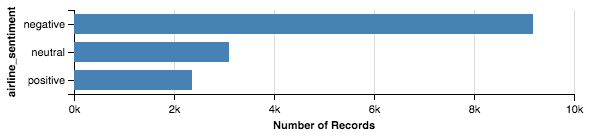

In [5]:
Chart(tweets).mark_bar().encode(
    x= 'count(airline_sentiment):Q',
    y = 'airline_sentiment'
)

In [6]:
tweets.airline_sentiment.value_counts()

negative    9178
neutral     3099
positive    2363
Name: airline_sentiment, dtype: int64

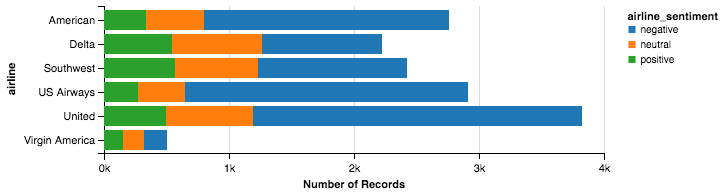

In [7]:
Chart(tweets).mark_bar().encode(
    x = 'count(airline_sentiment):Q',
    y = 'airline',
    color = 'airline_sentiment'
)

In [8]:
#cleaning data
#for column in tweet.text
#create dictionary of words and append
#if character in dict: update count
#if word not in dict: add and update count

wordsCounter = collections.Counter()
for tweet in tweets.iterrows():
    for word in tweet[1]['text'].split():
        if len(word)>0:
            if word[-1] in {'.', ',',':',';',')', '}','!',']','"','\'','?'}:
                word = word[:-1]

            if word[:1] in {'(','"','\'','{','['}:
                word = word[1:]
            c = collections.Counter({word.lower()})
            wordsCounter += c

wordsCounter

Counter({'': 290,
         'company': 83,
         'today...at': 1,
         '@hoagy10': 1,
         'ua1589': 1,
         'stahhppp!!': 1,
         'ending': 1,
         '#accessibility': 1,
         'preboard': 4,
         '599': 4,
         'lifting': 1,
         'attendents': 1,
         'call': 499,
         'https://t.co/ikqbdza7tn': 1,
         'waits..': 1,
         '^kn': 1,
         'http://t.co/cehroeurc5': 1,
         '#bethonors': 1,
         'confirmed': 40,
         'http://t.co/qrxvzfrd1z': 1,
         '@fispahani': 1,
         'separately': 3,
         'processed': 2,
         'wow!': 1,
         '@clarkhoward': 1,
         '@unitedappeals': 2,
         '#merger': 1,
         '$297': 1,
         'sna!!:': 1,
         'refers': 1,
         '😁😁😁😁': 1,
         'http://t.co/aau9mka6zy': 1,
         'strand': 8,
         'aka': 5,
         '0510': 2,
         'dualcam': 1,
         'day:': 1,
         'dfw&gt;&gt;mke': 1,
         'taxing': 3,
         'insulted': 3,
     

In [9]:
#counter.keys???
dictlist = list()
for value in wordsCounter:
    temp = [value]
    dictlist.append(temp)
dictlist
#wc = WordCloud(max_words=100, 
#            margin=10, 
#            random_state=1).generate(someList)

[[''],
 ['guess'],
 ['pearl'],
 ["expedia-there's"],
 ['hilarious'],
 ['shared'],
 ['customer..'],
 ["athlete's"],
 ['today...at'],
 ['http://t.co/n3lrfo4uay'],
 ['ua1589'],
 ['@matt_e_boss'],
 ['stahhppp!!'],
 ['ending'],
 ['http://t.co/cm4roiypc2'],
 ['#accessibility'],
 ['preboard'],
 ['#octavia'],
 ['market'],
 ['attendents'],
 ['call'],
 ['https://t.co/ikqbdza7tn'],
 ['philly'],
 ['sickcrew"'],
 ['^kn'],
 ['#lostrevenue'],
 ['suggestion-'],
 ['@airport_fra'],
 ['has'],
 ['27l'],
 ['confirmed'],
 ['http://t.co/qrxvzfrd1z'],
 ['b18'],
 ['hurting'],
 ['verification???'],
 ['waiting??'],
 ['separately'],
 ['cocktail...or'],
 ['processed'],
 ['@hoagy10'],
 ['wow!'],
 ['modifications'],
 ['comfort'],
 ['lit'],
 ['outline'],
 ['@clarkhoward'],
 ['kim'],
 ['@unitedappeals'],
 ['hof'],
 ['incompetency'],
 ['haul'],
 ['#merger'],
 ['holler'],
 ['gig'],
 ['labyrinth'],
 ['sna!!:'],
 ['failed'],
 ['miracle'],
 ['#saveface'],
 ['😁😁😁😁'],
 ['@phlairport'],
 ['$20'],
 ['diversion'],
 ['queue'],
 

In [10]:
#predict(tweet)
#for each word in tweet
#pos_prod = prospod*probability the word is positive
#ng_[rod = ng_prod *prob
#return positive or negative selecting the largest probability 

In [11]:
smallData = as.tweets.frame(prop.table(table(tweets$airline_sentiment)))
colnames(smallData) = c('Sentiment', 'Frequency')
smallData

SyntaxError: invalid syntax (<ipython-input-11-afbe7adbc0a3>, line 1)

In [12]:
my_map = Basemap(projection = 'robin', lat_0= 50, lon_0=-100,resolution = 'l')

/usr/local/lib/python3.5/site-packages/numpy/core/fromnumeric.py:224: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  return reshape(newshape, order=order)
/usr/local/lib/python3.5/site-packages/mpl_toolkits/basemap/__init__.py:3943: VisibleDeprecationWarning: using a non-integer number instead of an integer will result in an error in the future
  lats = lats[:,nx/2]


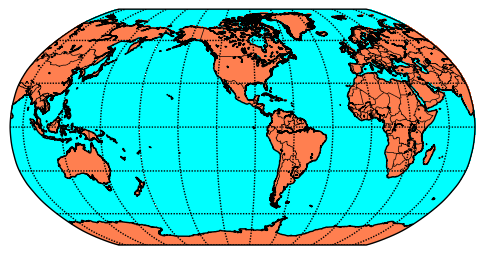

In [13]:
my_map.drawcoastlines()
my_map.drawcountries()
#my_map.fillcontinents(color = 'coral', lake_color = 'aqua')
#my_map.drawmapboundary(fill_color = 'aqua')
my_map.drawlsmask(land_color = 'coral', ocean_color = 'aqua')
#my_map.bluemarble()
my_map.drawparallels(np.arange(-90,90,30))
my_map.drawmeridians(np.arange(0,360,30))
plt.show()

<function matplotlib.pyplot.show>

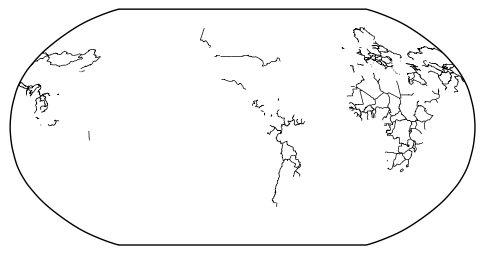

In [14]:
my_map.drawcountries()
plt.show

In [15]:
Basemap?

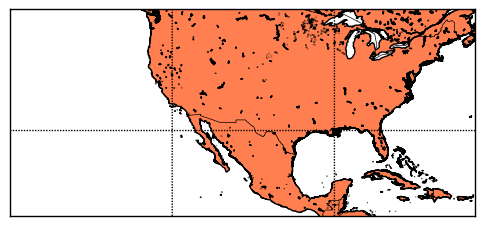

In [28]:
map = Basemap(projection='mill', lat_0=50, lon_0=-100,
    resolution = 'h', area_thresh = 0.1,
    llcrnrlon=-150, llcrnrlat=15,
    urcrnrlon=-64, urcrnrlat=49)
 
map.drawcoastlines()
map.drawcountries()
map.fillcontinents(color='coral')
map.drawmapboundary()
 
map.drawmeridians(np.arange(0, 360, 30))
map.drawparallels(np.arange(-90, 90, 30))
 
plt.show()

NameError: name 'head' is not defined

In [25]:
smallData = as.data.frame(prop.table(table(tweets$airline_sentiment)))
colnames(smallData) = c('Sentiment', 'Frequency')
smallData

SyntaxError: invalid syntax (<ipython-input-25-2122ef7ad215>, line 1)